In [50]:
# | tags: [parameters]
subject = 101

In [2]:
# | tags: [parameters]
# Injected Parameters
subject = 105

In [51]:
from spectral.viz import plot_step, plot_bad_channels, plot_epochs
import pandas as pd
import mne
import autoreject


from spectral.utils import print_date_time, read_parameters, config_project

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")


config = read_parameters()
my_paths = config_project(subject)
project_path = my_paths["project_path"]
print(project_path)
figures_path = my_paths["figures_path"]
print(figures_path)

/Users/daniel/PhD/Projects/psd-path
/Users/daniel/PhD/Projects/psd-path/analysis/figures/sub-101/


In [52]:
# Load the Excel file
df = pd.read_excel("ICA TO REMOVE.xlsx")

# Print the DataFrame
df_extracted = df.iloc[:, :2]
df_extracted = df_extracted.rename(
    columns={df_extracted.columns[1]: "ica_bad_components"}
)

row = df_extracted.loc[df_extracted["ID"] == subject]
ica_bad_components_string = row["ica_bad_components"].iloc[0]
ica_bad_components = [int(component) for component in ica_bad_components_string.split()]

print(f"ID: {subject}, ICA Bad Components: {ica_bad_components}")

ID: 101, ICA Bad Components: [0, 1, 2, 4, 8, 11, 12, 14, 15]


Reading /Users/daniel/PhD/Projects/psd-path/analysis/sub-101_good_epochs-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    5000.00 ms
        0 CTF compensation matrices available
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated
Reading /Users/daniel/PhD/Projects/psd-path/analysis/sub-101_my_ica_model-ica.fif ...
Now restoring ICA solution ...
Ready.
ID: 101, ICA Bad Components: [0, 1, 2, 4, 8, 11, 12, 14, 15]


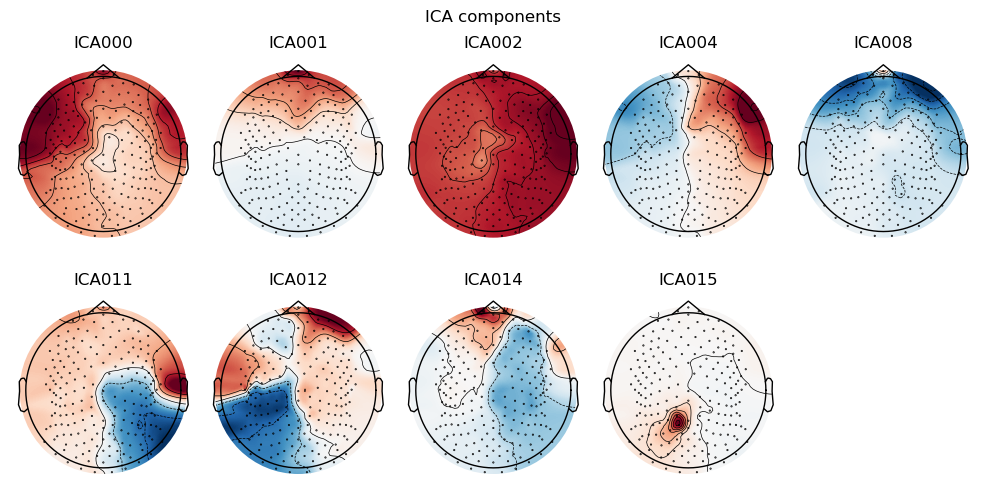

Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


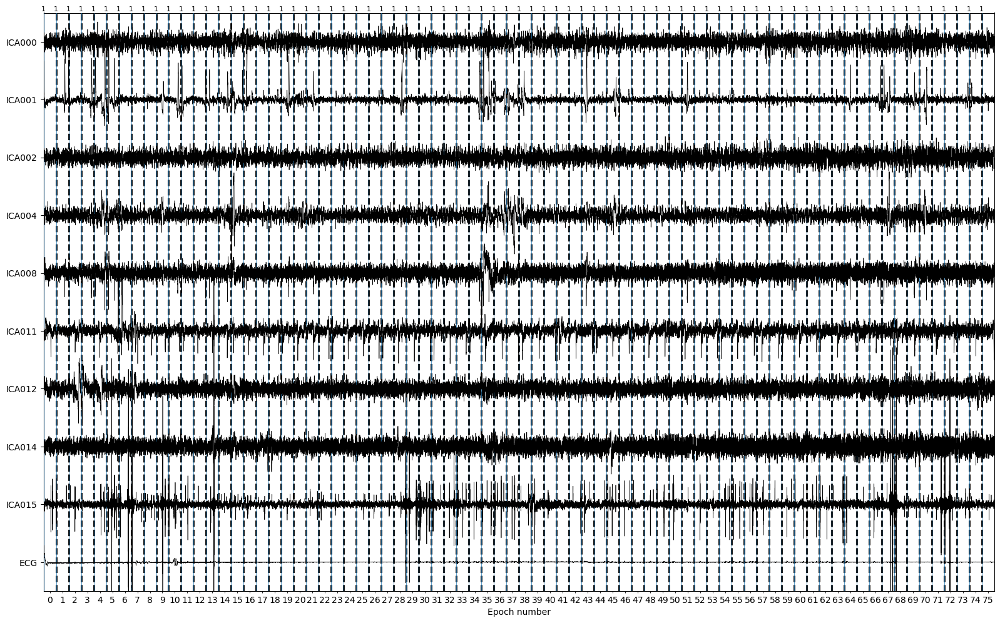

Applying ICA to Evoked instance
    Transforming to ICA space (22 components)
    Zeroing out 9 ICA components
    Projecting back using 202 PCA components


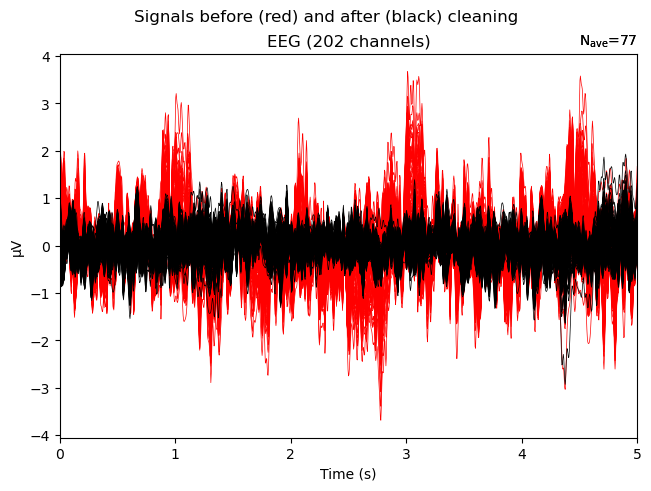

In [56]:
epochs_good = mne.read_epochs(
    f"{project_path}/analysis/sub-{subject}_good_epochs-epo.fif"
)
ica = mne.preprocessing.read_ica(
    f"{project_path}/analysis/sub-{subject}_my_ica_model-ica.fif"
)
ica.exclude = []

print(f"ID: {subject}, ICA Bad Components: {ica_bad_components}")

ica_plot_components = ica.plot_components(picks=ica_bad_components)
ica_plot = ica.plot_sources(
    epochs_good,
    picks=ica_bad_components,
    show_scrollbars=False,
    start=0,
    stop=len(epochs_good) - 1,
)

ica.exclude = ica_bad_components
cleaned_plot = ica.plot_overlay(epochs_good.average())

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


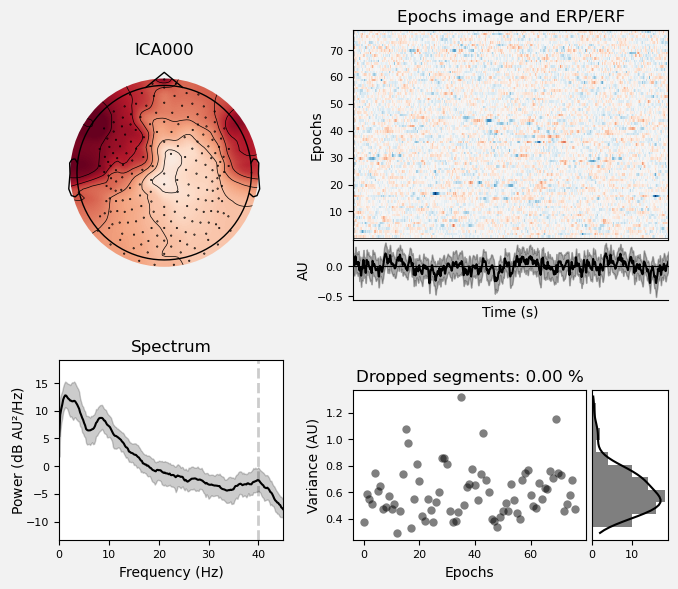

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


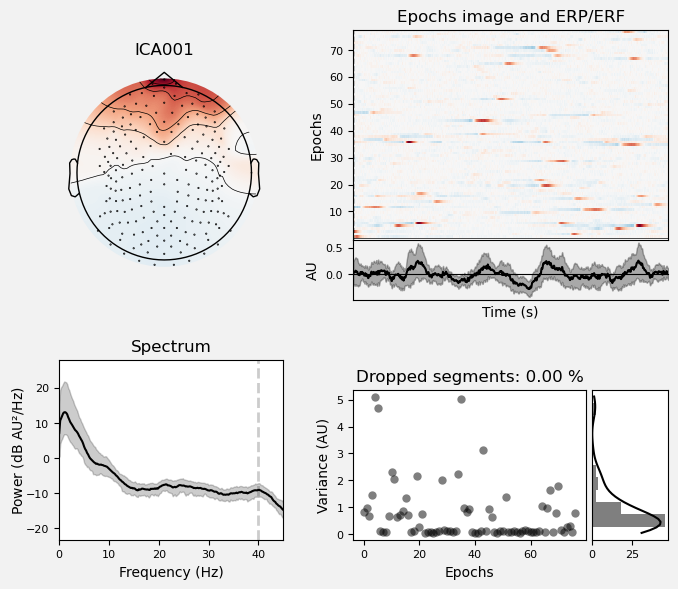

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


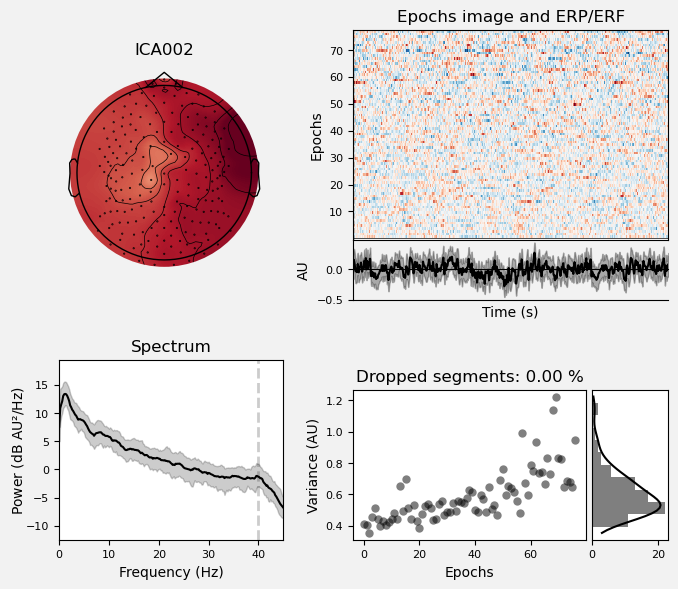

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


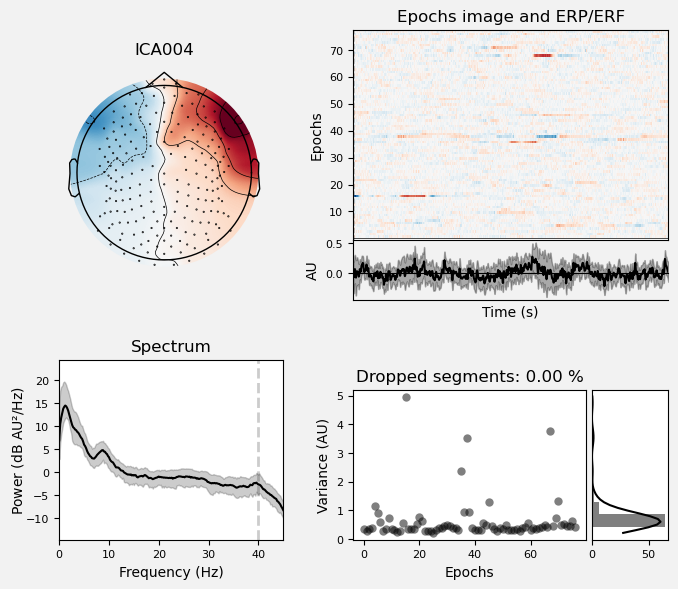

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


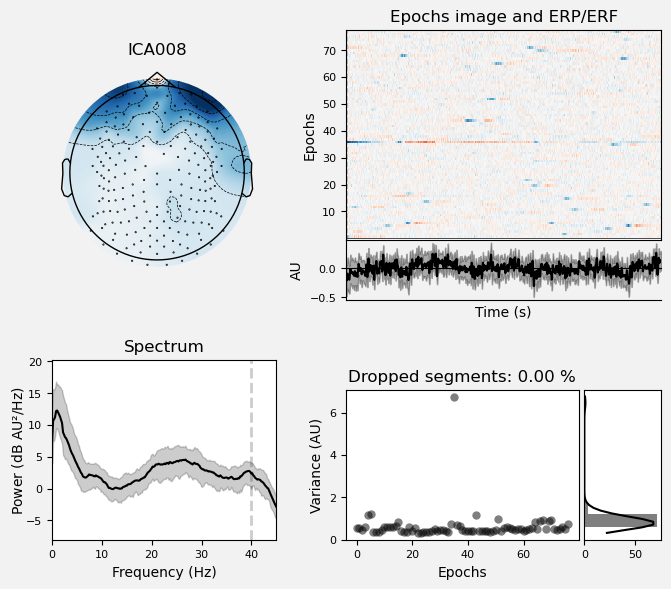

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


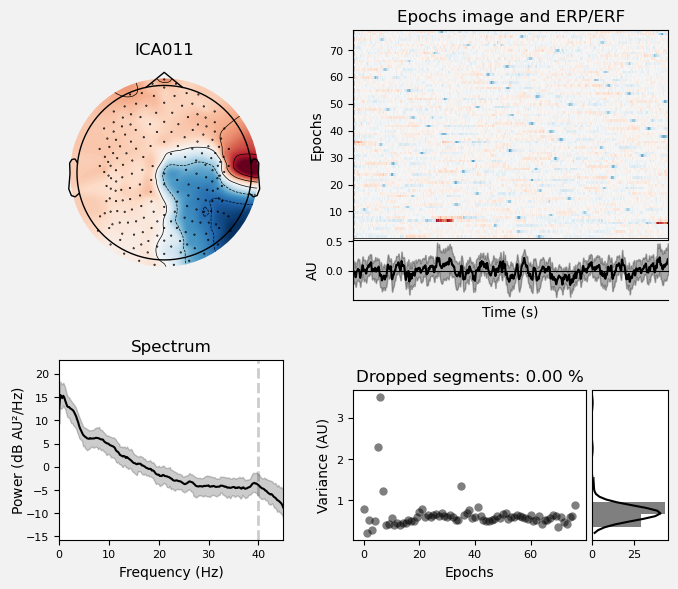

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


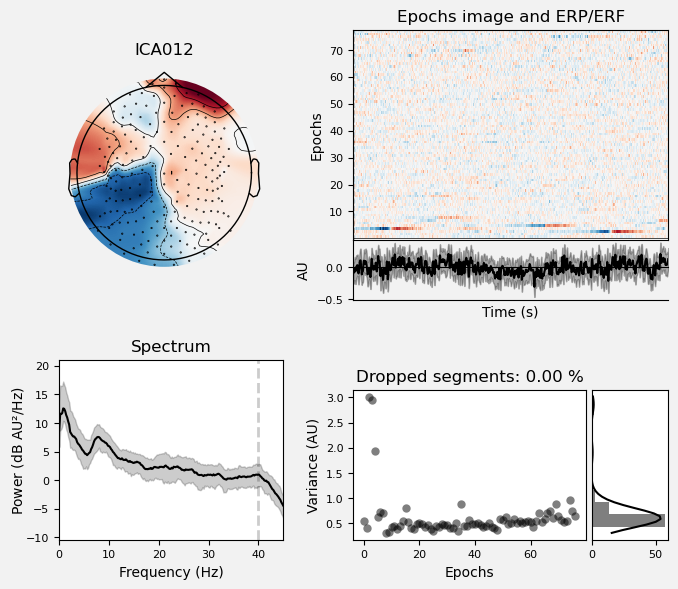

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


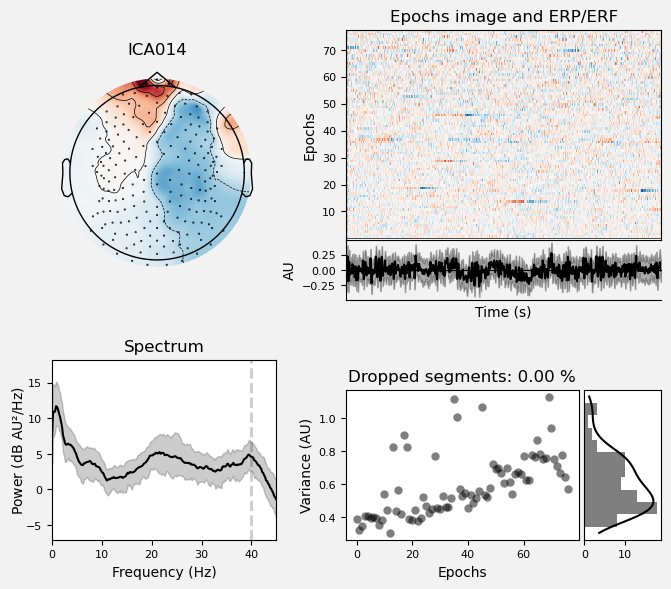

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


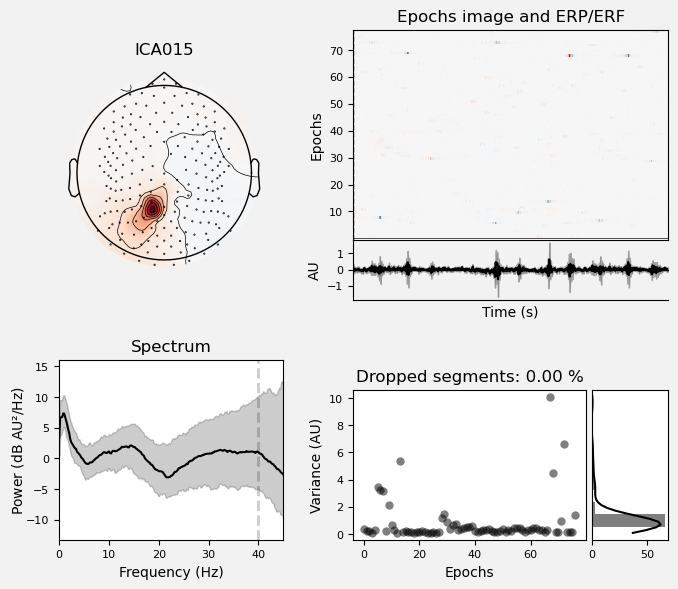

In [57]:
for component in sorted(ica_bad_components):
    ica_plot = ica.plot_properties(
        epochs_good, picks=component, psd_args={"fmax": 45.0}
    )

Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


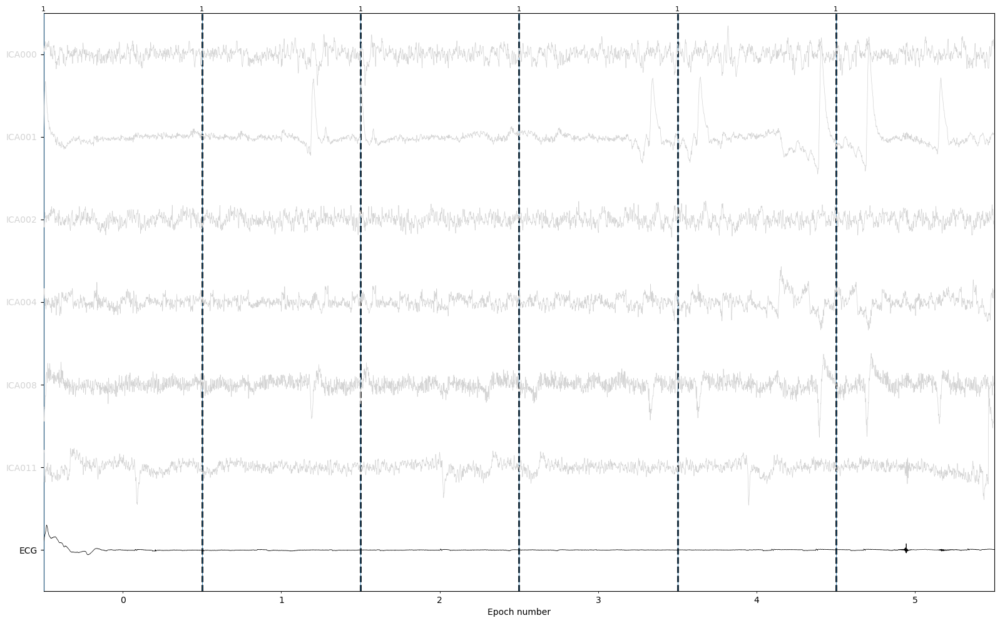

Not setting metadata
77 matching events found
No baseline correction applied
0 projection items activated


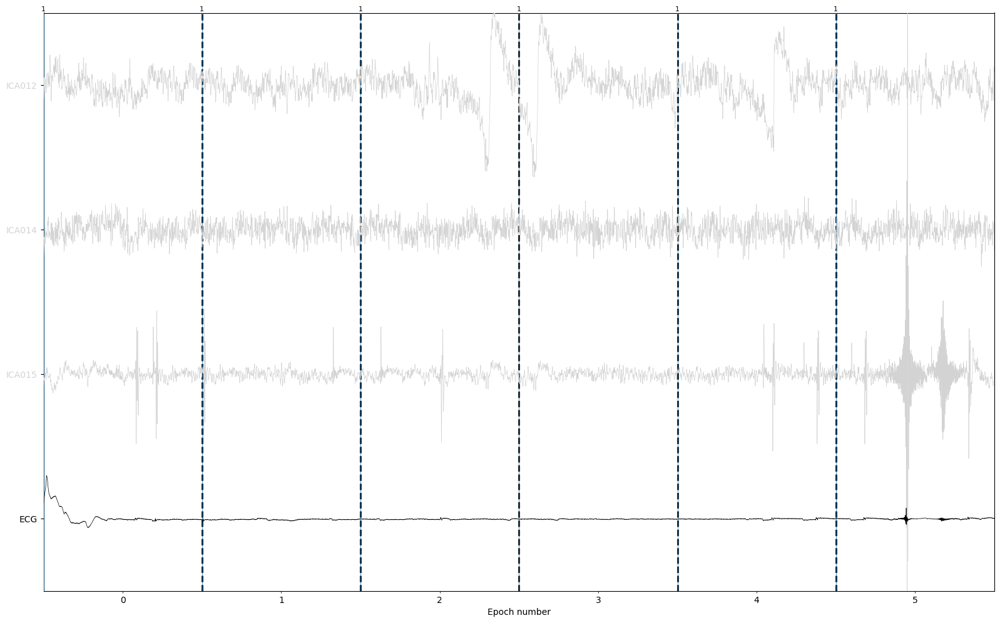

In [58]:
ica_bad_components

chunks = [ica_bad_components[i : i + 6] for i in range(0, len(ica_bad_components), 6)]
try:
    for chunk in chunks:
        ica_plot = ica.plot_sources(
            epochs_good,
            picks=chunk,
            show_scrollbars=False,
            start=0,
            stop=6,
        )
except Exception as e:
    print(f"An error occurred: {e}")

# Retained components - all epochs


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


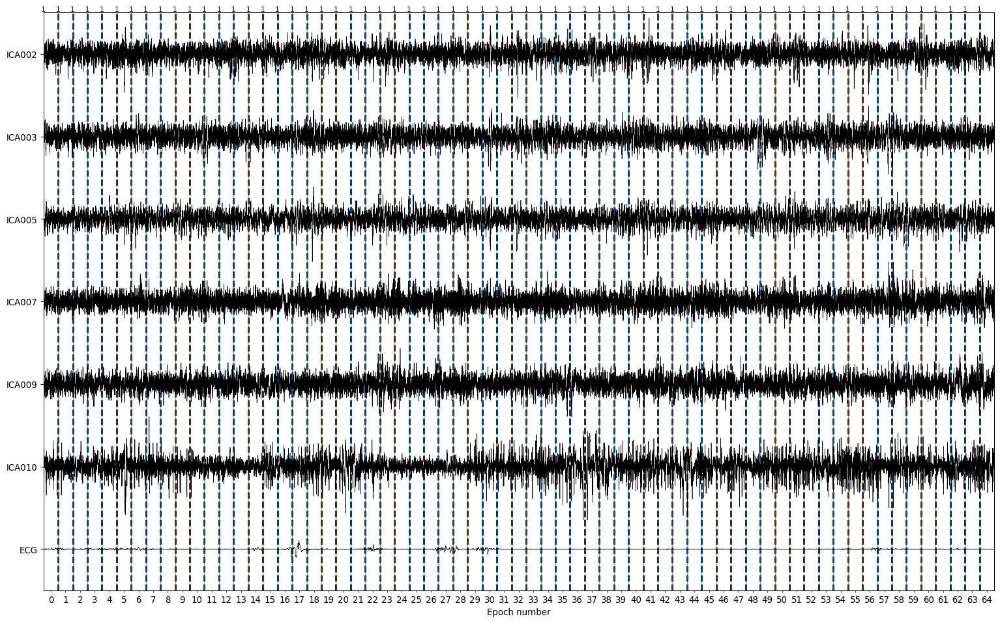

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


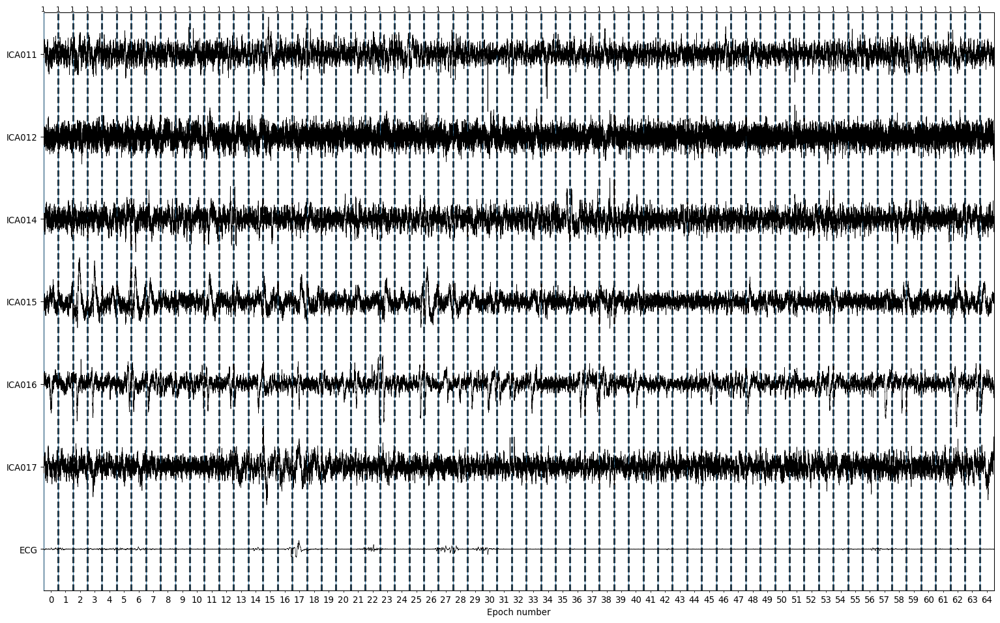

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


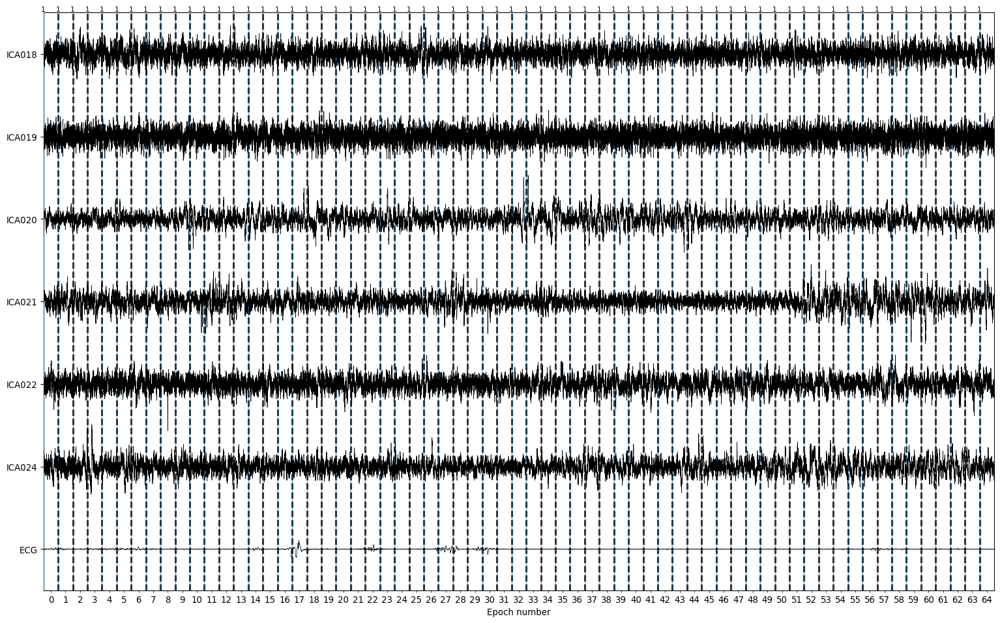

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


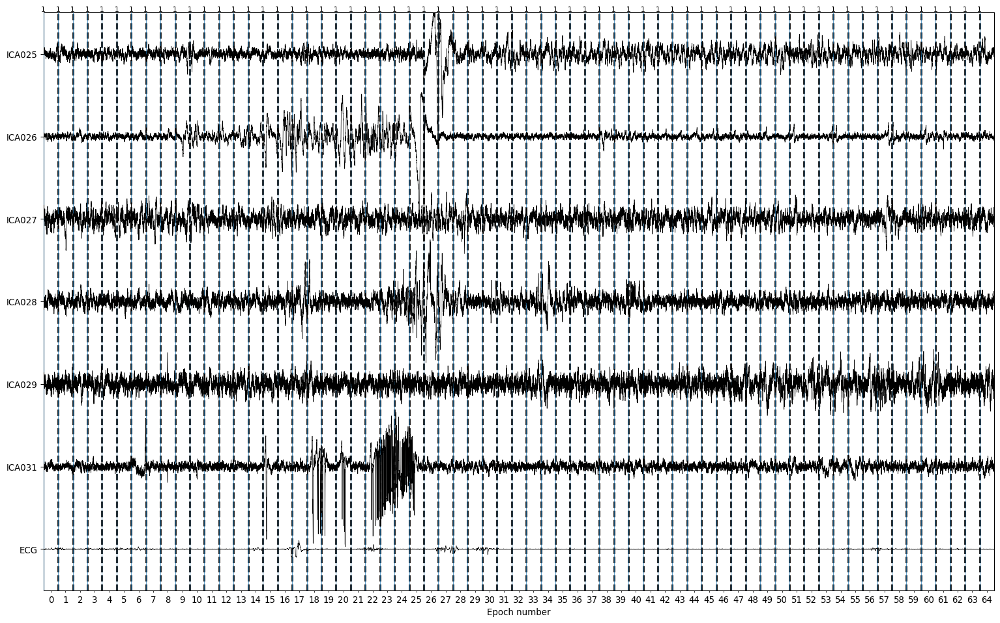

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


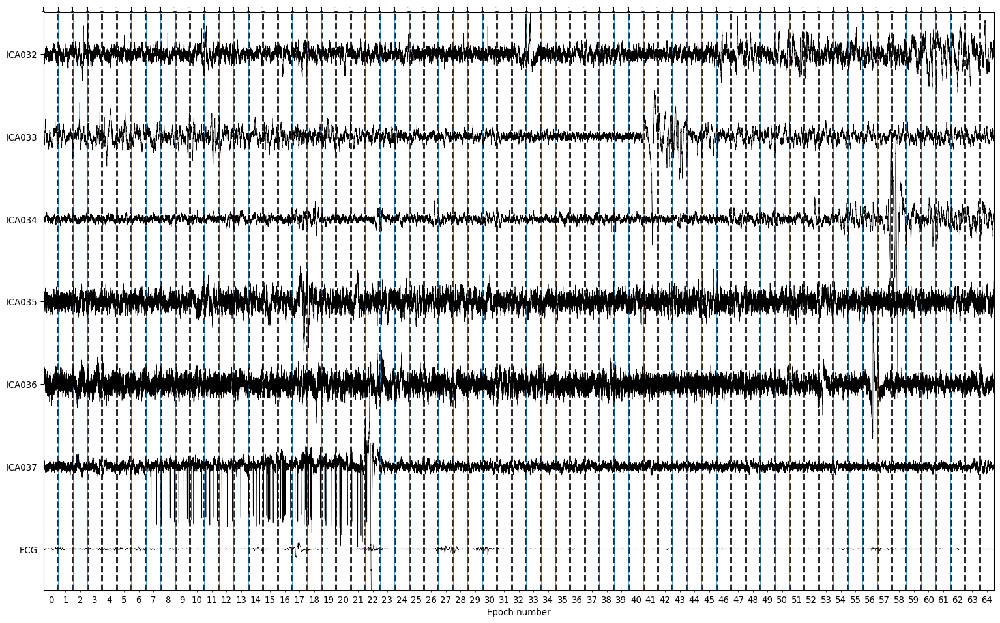

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


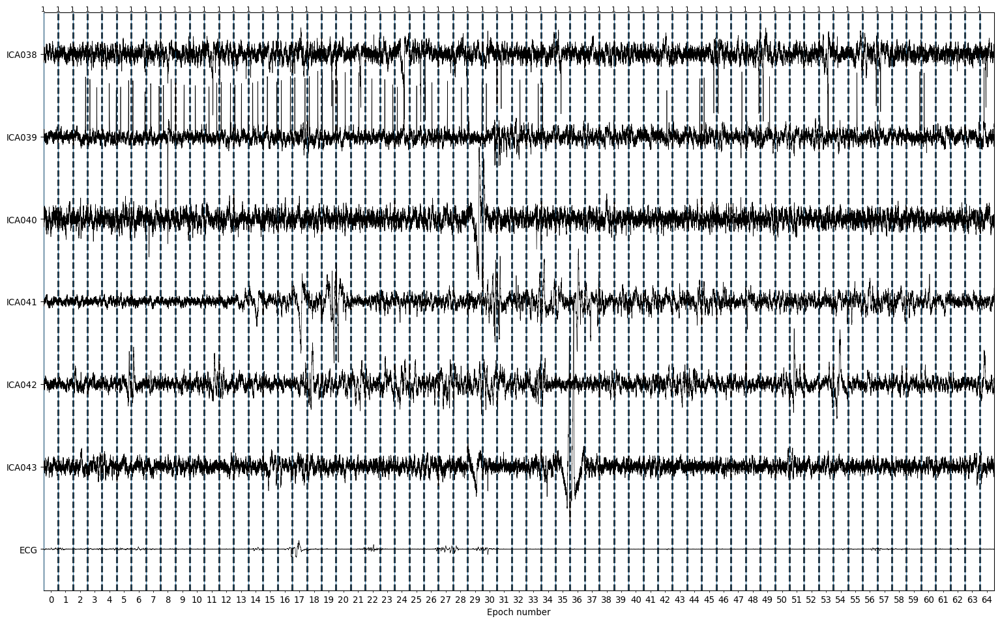

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


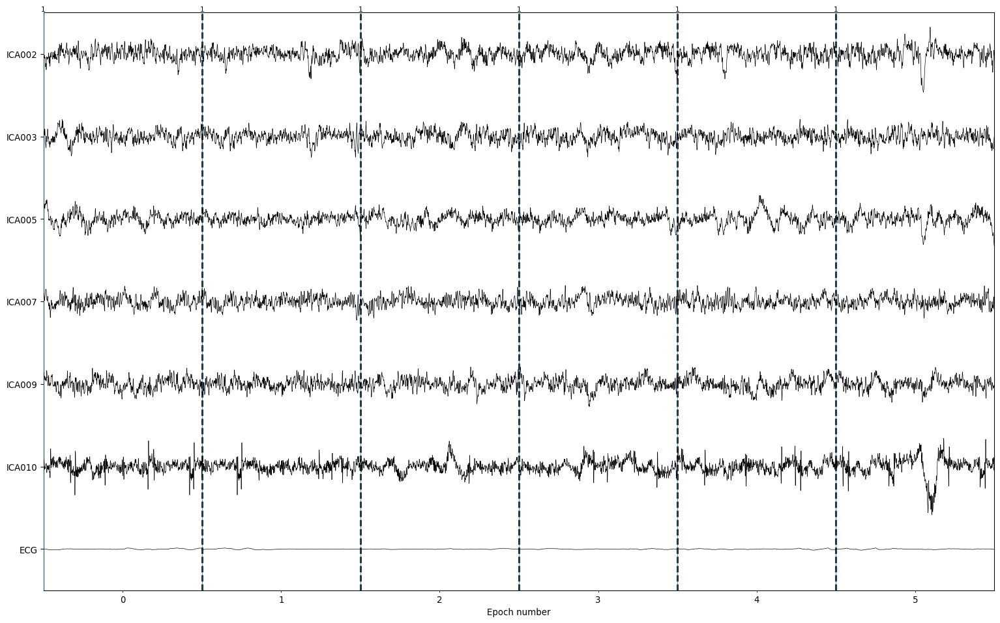

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


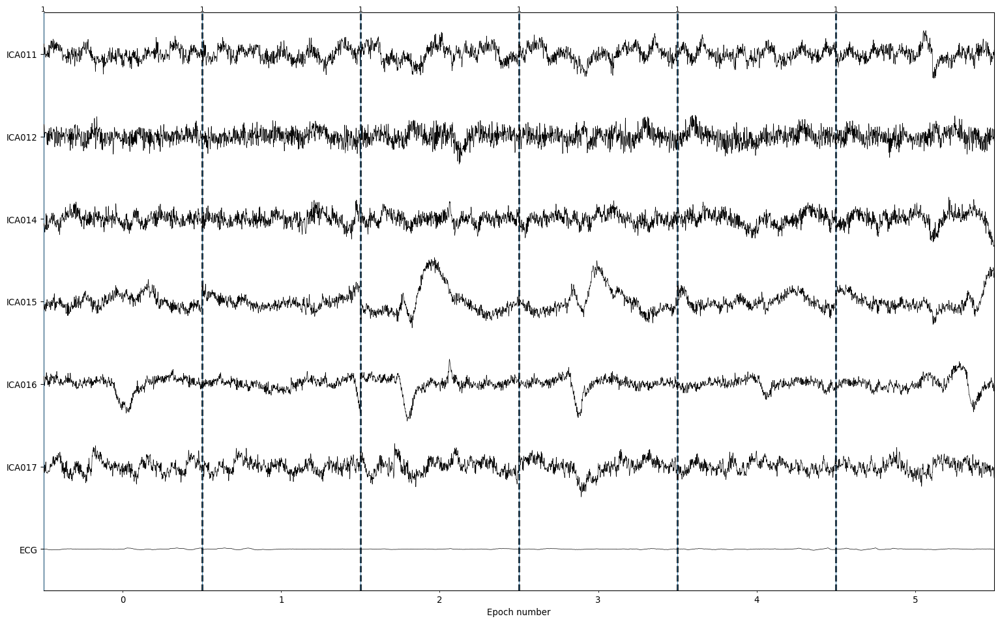

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


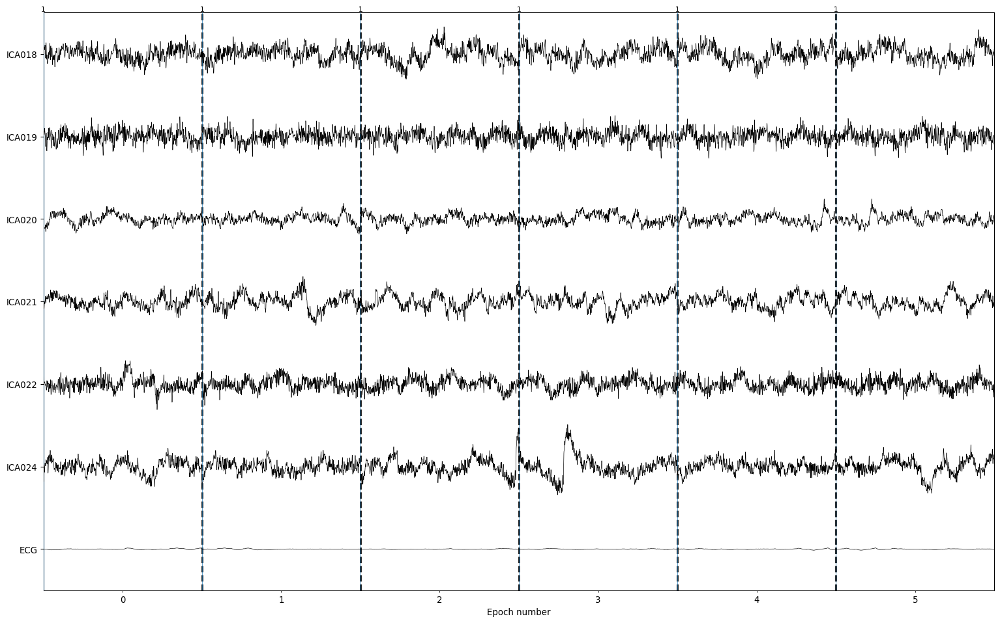

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


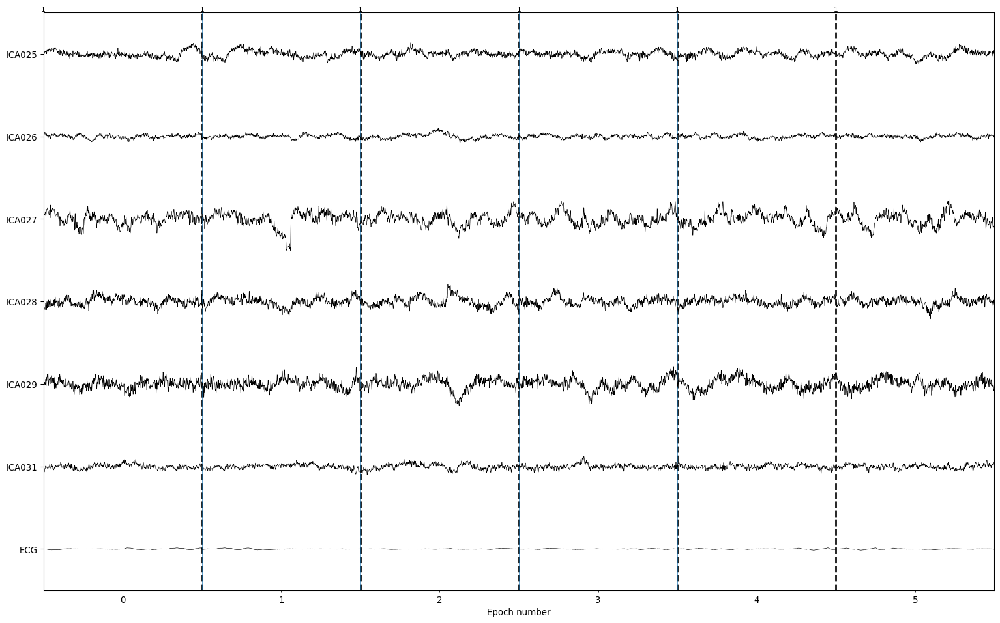

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


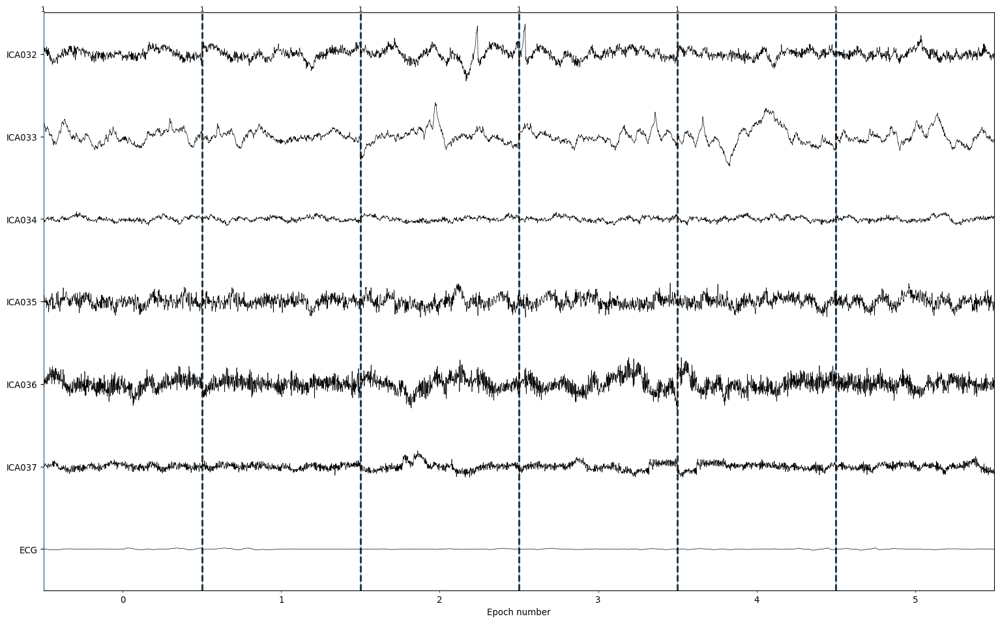

Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


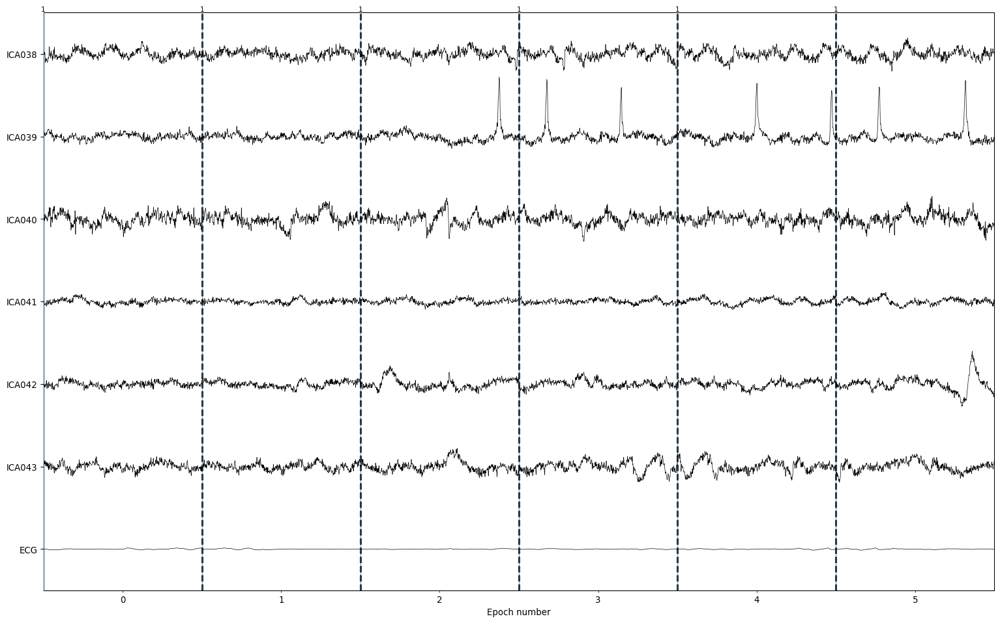

In [7]:
ica_indices = list(range(ica.n_components_))
good_components = [i for i in ica_indices if i not in ica_bad_components]
ica_plot_components = ica.plot_components(picks=good_components)
chunks = [good_components[i : i + 6] for i in range(0, len(good_components), 6)]


for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=0,
        stop=len(epochs_good) - 1,
    )

# Retained components - first 6 ecpochs


In [ ]:
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=0,
        stop=6,
    )

# Retained components - epochs 20-30


In [ ]:
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=20,
        stop=30,
    )

# Retained components - epochs 30-40


In [ ]:
try:
    for chunk in chunks:
        ica_plot = ica.plot_sources(
            epochs_good,
            picks=chunk,
            show_scrollbars=False,
            start=20,
            stop=30,
        )
except Exception as e:
    print(f"An error occurred: {e}")

# Retained components - miniplots


    Using multitaper spectrum estimation with 7 DPSS windows


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/mne/viz/ica.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


Not setting metadata


66 matching events found


No baseline correction applied


0 projection items activated


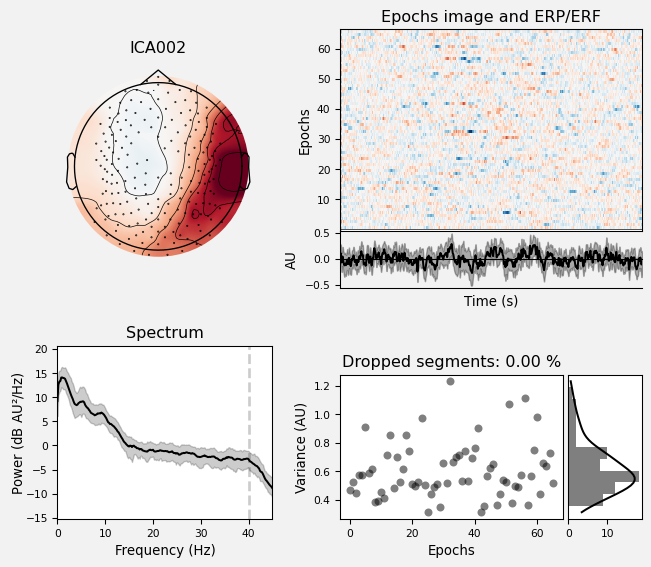

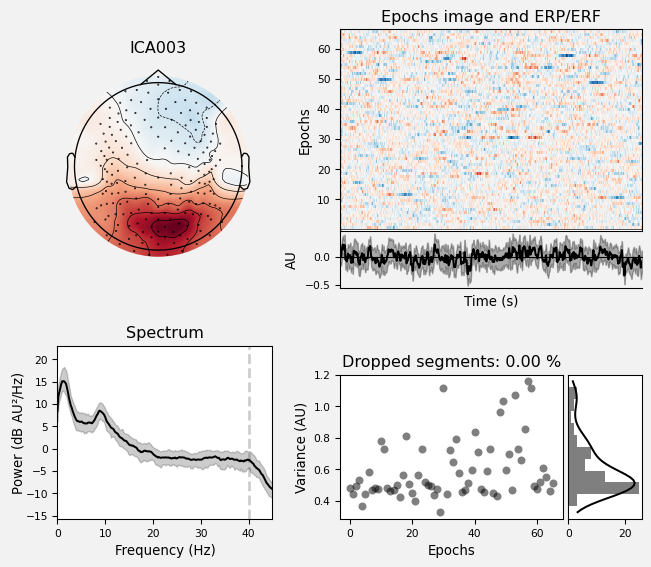

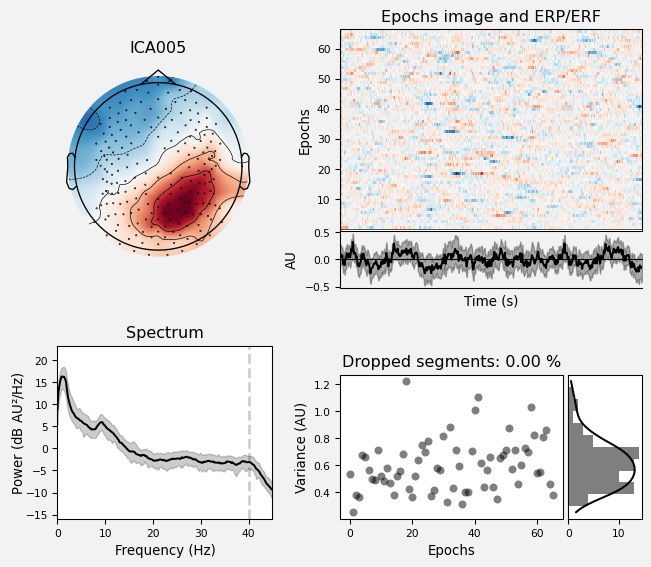

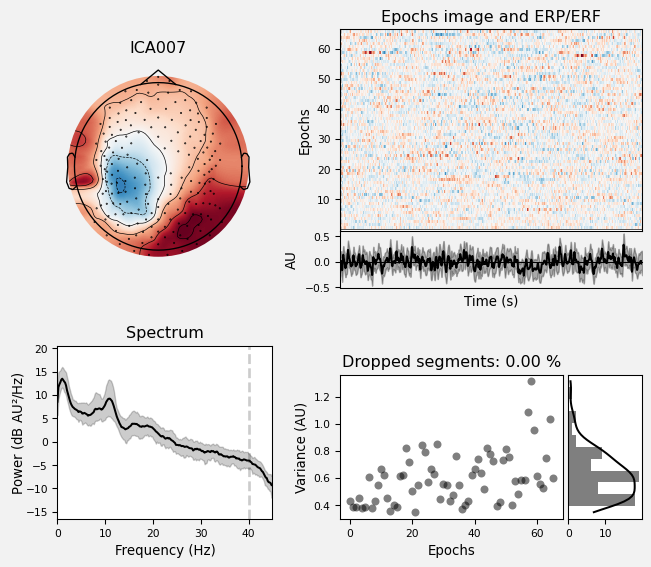

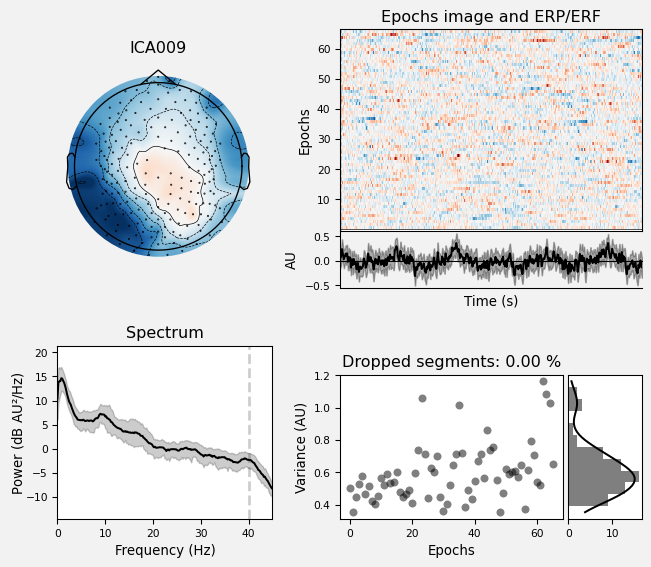

...

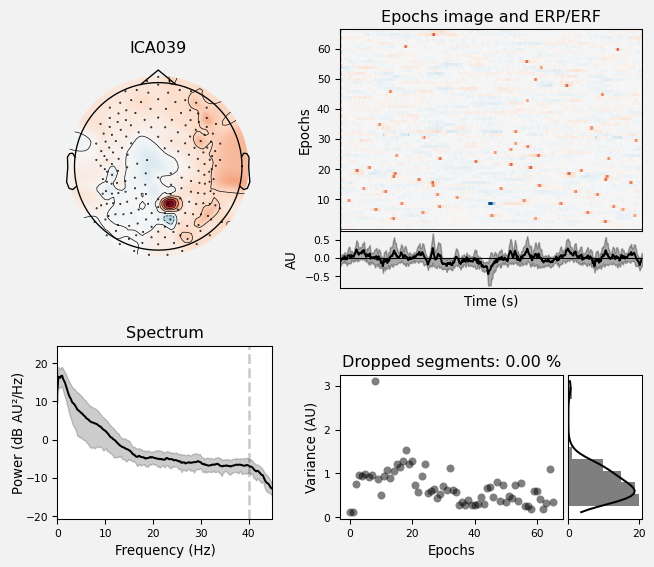

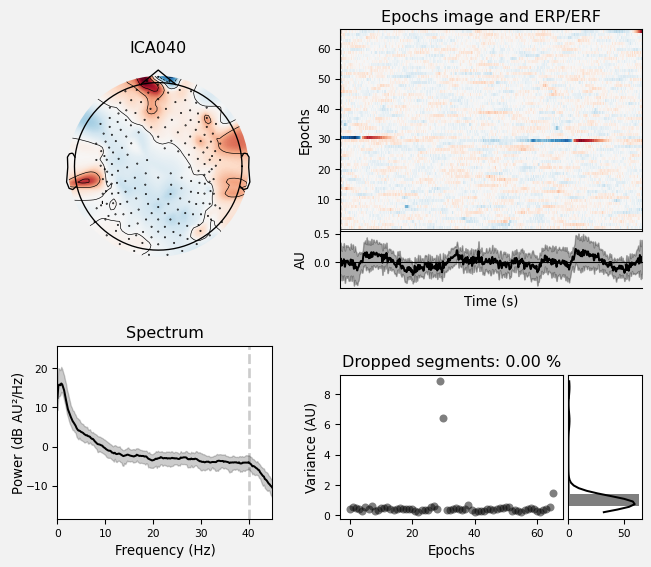

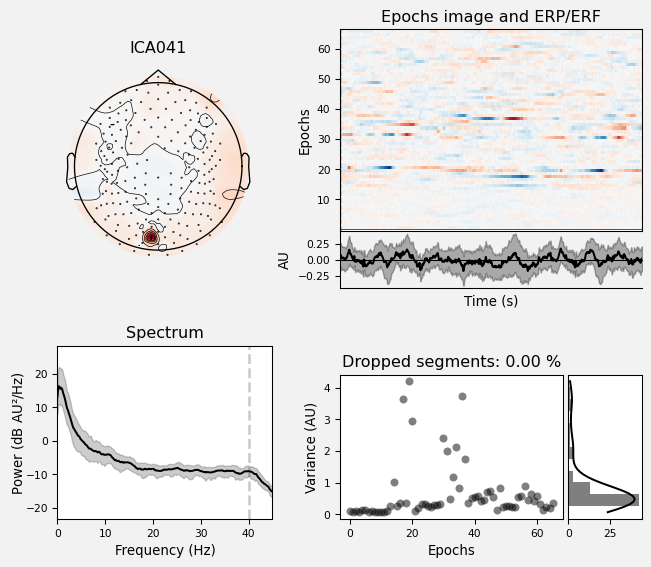

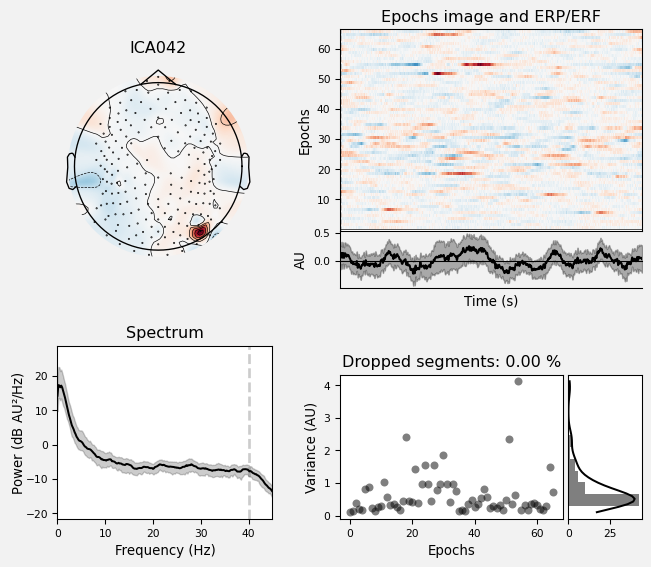

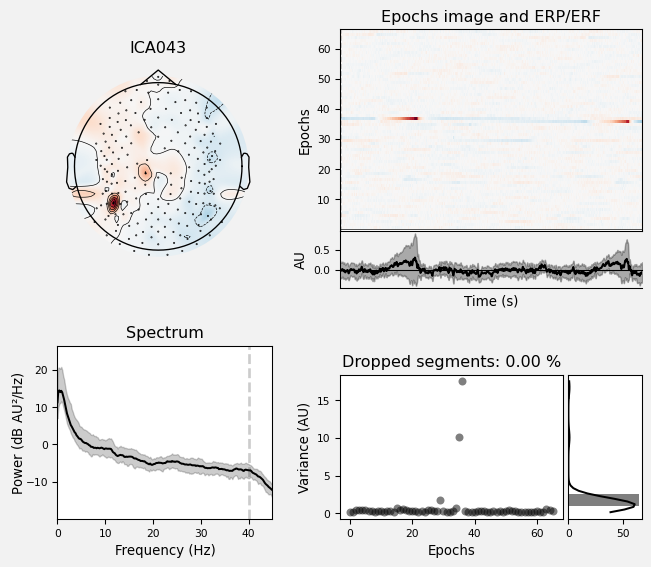

In [8]:
ica_plot = ica.plot_properties(
    epochs_good, picks=good_components, psd_args={"fmax": 45.0}, show=False
)

In [9]:
# import io
# from PIL import Image
# import numpy as np

# # Assuming 'ica_plot' is your list of figures
# pil_images = []
# for fig in ica_plot:
#     buf = io.BytesIO()
#     fig.savefig(buf, format="png")
#     buf.seek(0)
#     pil_images.append(Image.open(buf))


# # Assuming 'pil_images' is your list of PIL Images
# images = [np.array(img) for img in pil_images]

# # Concatenate the images vertically
# concatenated_image = Image.fromarray(np.hstack(images))

# # Display the concatenated imag
# display(concatenated_image)

# Saving epochs after ICA removal


Applying ICA to Epochs instance


    Transforming to ICA space (44 components)


    Zeroing out 8 ICA components


    Projecting back using 198 PCA components


<ICA | epochs decomposition, method: picard (fit in 123 iterations on 82566 samples), 44 ICA components (198 PCA components available), channel types: eeg, 8 sources marked for exclusion>

Overwriting existing file.


Overwriting existing file.


No projector specified for this dataset. Please consider the method self.add_proj.


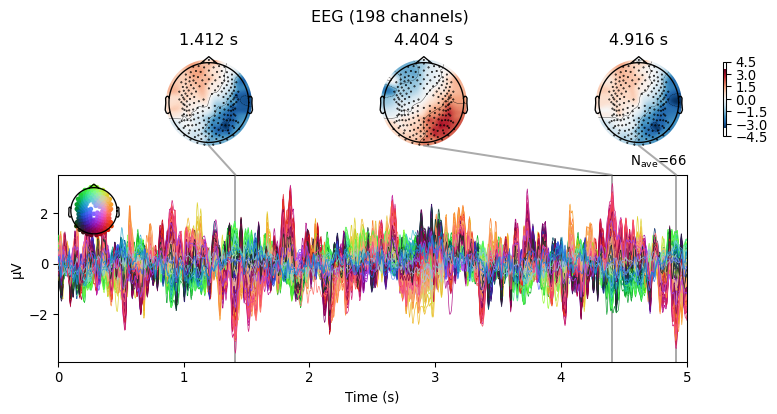

Effective window size : 5.004 (s)


Plotting power spectral density (dB=True).


Averaging across epochs...


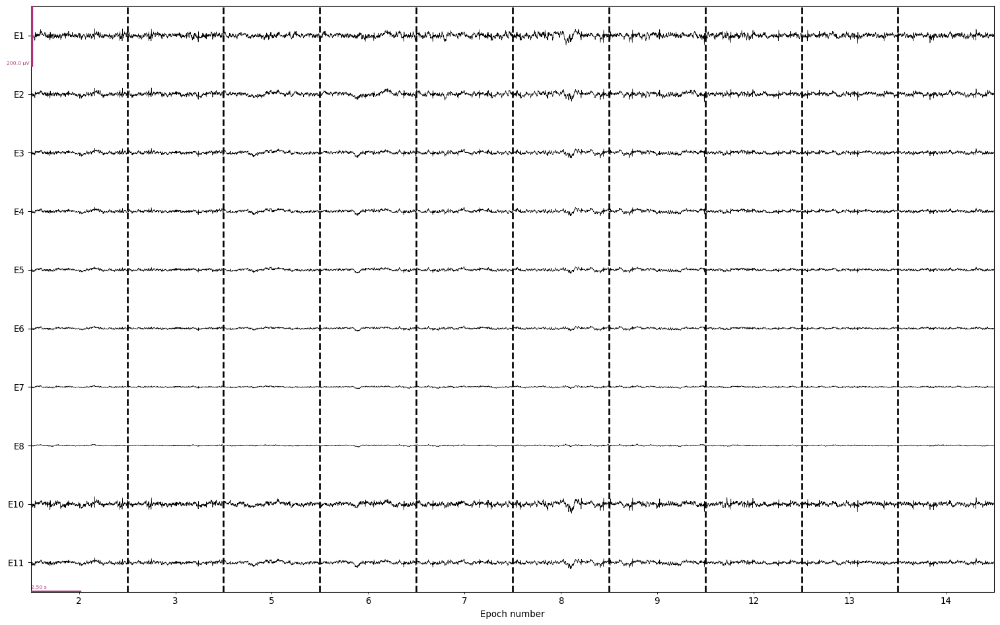

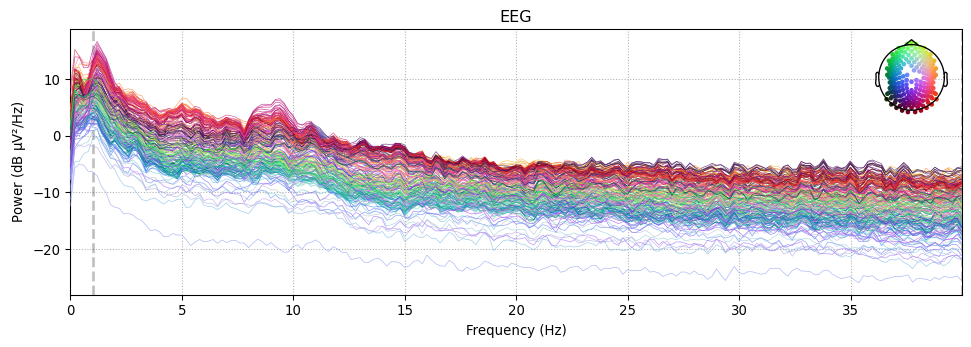

In [10]:
epochs_clean_manual = ica.apply(epochs_good.copy(), exclude=ica.exclude)
print(ica)

epochs_clean_manual.save(
    f"{project_path}/analysis/sub-{subject}_clean_ica-manual-epo.fif", overwrite=True
)
epochs_plot, epochs_plot_psd = plot_epochs(
    epochs_clean_manual, figures_path=figures_path, subject=subject, fmax=40.0
)